# Object Detection Dataset Augmentation
# EE417 Assignment #2 - Stage 3 Implementation

In [1]:
import os
import glob
import xml.etree.ElementTree as ET
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageEnhance
import random
import copy
import shutil
from tqdm import tqdm

#### Accessing the Dataset

In [2]:
# Set the base paths according to the folder structure
BASE_PATH = "/content/drive/MyDrive/EE 417/THE2/dataset"
IMAGES_PATH = os.path.join(BASE_PATH, "images")
ANNOTATIONS_PATH = os.path.join(BASE_PATH, "annotations")

In [3]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# Create directories for augmented images and annotations if they don't exist
def create_directoriessss():
    directories = [
        os.path.join(BASE_PATH, "augmented_images"),
        os.path.join(BASE_PATH, "augmented_annotations")
    ]

    for directory in directories:
        if not os.path.exists(directory):
            os.makedirs(directory)
            print(f"Created directory: {directory}")
        else:
            print(f"Directory already exists: {directory}")

    return directories[0], directories[1]

In [5]:
def create_directories():
    img_out = os.path.join(BASE_PATH, "augmented_images")
    xml_out = os.path.join(BASE_PATH, "augmented_annotations")
    vis_out = os.path.join(BASE_PATH, "augmented_images_vis")
    for d in (img_out, xml_out, vis_out):
        if os.path.exists(d):
            # remove old if you like, or just empty
            shutil.rmtree(d)
        os.makedirs(d)
    return img_out, xml_out, vis_out

In [6]:
# Load original images and annotations
def load_dataset():
    # Find all jpg images in the images folder
    image_paths = glob.glob(os.path.join(IMAGES_PATH, "*.jpg"))

    # Find all xml annotation files
    annotation_paths = glob.glob(os.path.join(ANNOTATIONS_PATH, "*.xml"))

    # Match image paths with their annotation paths
    dataset = []
    for img_path in image_paths:
        base_name = os.path.splitext(os.path.basename(img_path))[0]
        xml_path = os.path.join(ANNOTATIONS_PATH, f"{base_name}.xml")

        if os.path.exists(xml_path):
            dataset.append((img_path, xml_path))
        else:
            print(f"Warning: Could not find annotation for {img_path}")

    print(f"Loaded {len(dataset)} image-annotation pairs")
    return dataset

In [7]:
# Parse XML annotation file
def parse_annotation(xml_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    # Get image dimensions
    width = int(root.find('size/width').text)
    height = int(root.find('size/height').text)

    # Get bounding boxes
    boxes = []
    for obj in root.findall('object'):
        class_name = obj.find('name').text
        xmin = int(obj.find('bndbox/xmin').text)
        ymin = int(obj.find('bndbox/ymin').text)
        xmax = int(obj.find('bndbox/xmax').text)
        ymax = int(obj.find('bndbox/ymax').text)

        boxes.append({
            'class': class_name,
            'xmin': xmin,
            'ymin': ymin,
            'xmax': xmax,
            'ymax': ymax
        })

    return {'width': width, 'height': height, 'boxes': boxes}


In [8]:
# Update XML annotation with new bounding boxes and image dimensions
def update_annotation(xml_path, new_boxes, new_width, new_height, output_path):
    tree = ET.parse(xml_path)
    root = tree.getroot()

    # Update image dimensions
    root.find('size/width').text = str(new_width)
    root.find('size/height').text = str(new_height)

    # Remove all existing object elements
    for obj in root.findall('object'):
        root.remove(obj)

    # Add new object elements
    for box in new_boxes:
        obj_elem = ET.SubElement(root, 'object')

        name_elem = ET.SubElement(obj_elem, 'name')
        name_elem.text = box['class']

        pose_elem = ET.SubElement(obj_elem, 'pose')
        pose_elem.text = 'Unspecified'

        truncated_elem = ET.SubElement(obj_elem, 'truncated')
        truncated_elem.text = '0'

        difficult_elem = ET.SubElement(obj_elem, 'difficult')
        difficult_elem.text = '0'

        bndbox_elem = ET.SubElement(obj_elem, 'bndbox')

        xmin_elem = ET.SubElement(bndbox_elem, 'xmin')
        xmin_elem.text = str(max(1, int(box['xmin'])))

        ymin_elem = ET.SubElement(bndbox_elem, 'ymin')
        ymin_elem.text = str(max(1, int(box['ymin'])))

        xmax_elem = ET.SubElement(bndbox_elem, 'xmax')
        xmax_elem.text = str(min(new_width, int(box['xmax'])))

        ymax_elem = ET.SubElement(bndbox_elem, 'ymax')
        ymax_elem.text = str(min(new_height, int(box['ymax'])))

    # Write to new file
    tree.write(output_path)


In [9]:
# Function to visualize image with bounding boxes
def visualize_image_with_boxes(image, boxes, title="Image with Bounding Boxes"):
    img_copy = image.copy()

    # Draw bounding boxes
    for box in boxes:
        cv2.rectangle(img_copy,
                     (box['xmin'], box['ymin']),
                     (box['xmax'], box['ymax']),
                     (0, 255, 0), 2)

        # Add class label
        cv2.putText(img_copy,
                   box['class'],
                   (box['xmin'], box['ymin'] - 5),
                   cv2.FONT_HERSHEY_SIMPLEX,
                   0.5,
                   (0, 255, 0),
                   2)

    # Convert BGR to RGB for matplotlib
    img_rgb = cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10, 8))
    plt.imshow(img_rgb)
    plt.title(title)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

In [10]:
# helper to draw boxes in‐place
def draw_boxes(image, boxes):
    out = image.copy()
    for b in boxes:
        cv2.rectangle(out,
                      (b['xmin'], b['ymin']),
                      (b['xmax'], b['ymax']),
                      (0,255,0), 2)
        cv2.putText(out,
                    b['class'],
                    (b['xmin'], b['ymin']-6),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.5,(0,255,0),1)
    return out

# =============== AUGMENTATION FUNCTIONS ================

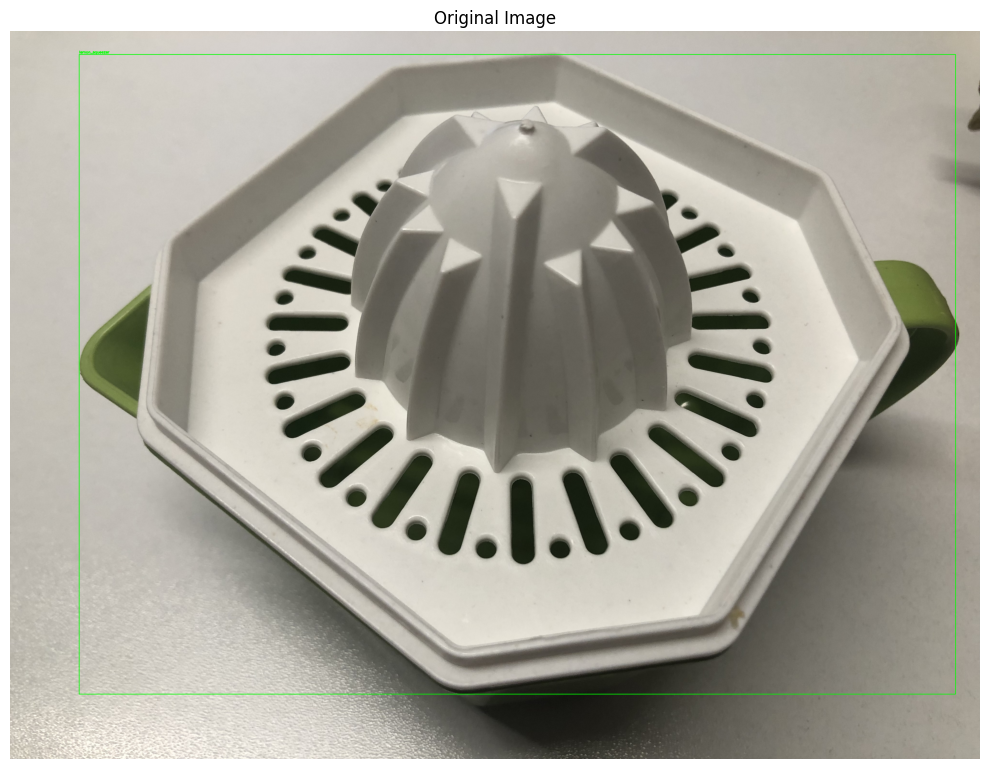

In [11]:
# load your first sample
img_path = "/content/drive/MyDrive/EE 417/THE2/dataset/images/IMG_5512.jpg"
xml_path = img_path.replace("/images/","/annotations/").replace(".jpg",".xml")
image     = cv2.imread(img_path)
annotation = parse_annotation(xml_path)
visualize_image_with_boxes(image, annotation['boxes'], "Original Image")

In [12]:
'''
img_path = "/content/drive/MyDrive/EE 417/THE2/dataset/images/IMG_5512.jpg"

# Load and convert BGR to RGB (for matplotlib)
image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display it
plt.figure(figsize=(8, 8))
plt.imshow(image)
plt.axis('off')
plt.title("Original Image")
plt.show()
'''

'\nimg_path = "/content/drive/MyDrive/EE 417/THE2/dataset/images/IMG_5512.jpg"\n\n# Load and convert BGR to RGB (for matplotlib)\nimage = cv2.imread(img_path)\nimage = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)\n\n# Display it\nplt.figure(figsize=(8, 8))\nplt.imshow(image)\nplt.axis(\'off\')\nplt.title("Original Image")\nplt.show()\n'

Flip and Rotate

In [13]:
# 1. Flip and rotate augmentations
def flip_horizontal(image, boxes, img_width):
    """Horizontal flip augmentation."""
    flipped_image = cv2.flip(image, 1)  # 1 for horizontal flip

    # Update bounding boxes
    flipped_boxes = []
    for box in boxes:
        new_box = box.copy()
        new_box['xmin'] = img_width - box['xmax']
        new_box['xmax'] = img_width - box['xmin']
        flipped_boxes.append(new_box)

    return flipped_image, flipped_boxes

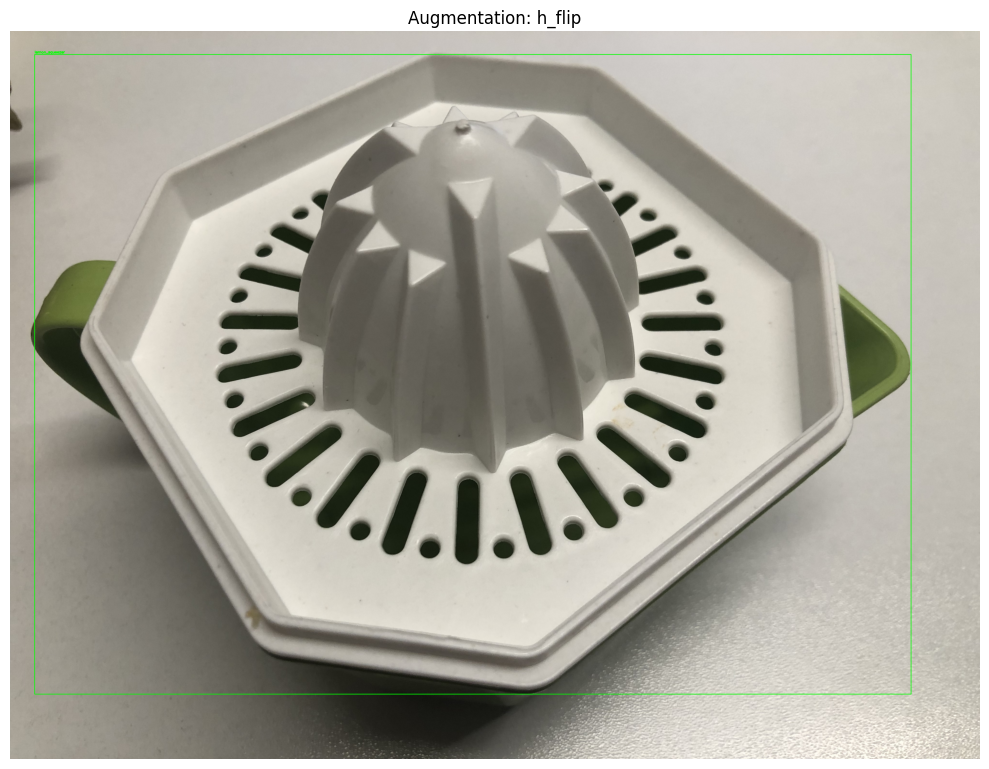

In [14]:
h_img, h_boxes = flip_horizontal(image, annotation['boxes'], annotation['width'])
visualize_image_with_boxes(h_img, h_boxes, "Augmentation: h_flip")

In [15]:
def flip_vertical(image, boxes, img_height):
    """Vertical flip augmentation."""
    flipped_image = cv2.flip(image, 0)  # 0 for vertical flip

    # Update bounding boxes
    flipped_boxes = []
    for box in boxes:
        new_box = box.copy()
        new_box['ymin'] = img_height - box['ymax']
        new_box['ymax'] = img_height - box['ymin']
        flipped_boxes.append(new_box)

    return flipped_image, flipped_boxes


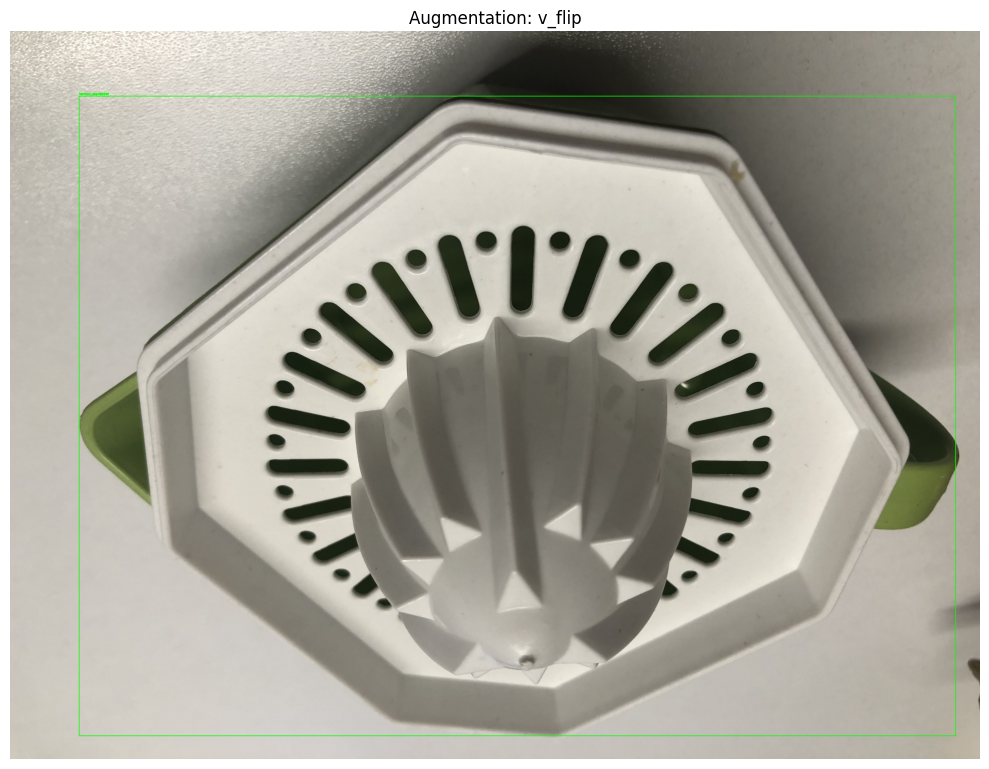

In [16]:
v_img, v_boxes = flip_vertical(image, annotation['boxes'], annotation['height'])
visualize_image_with_boxes(v_img, v_boxes, "Augmentation: v_flip")

In [17]:
def rotate_image_with_polygons(image, angle, boxes):
    h, w = image.shape[:2]
    cx, cy = w//2, h//2

    # build the 2×3 rotation matrix
    M = cv2.getRotationMatrix2D((cx, cy), angle, 1.0)
    # compute new bounds
    cos, sin = abs(M[0,0]), abs(M[0,1])
    nw = int(h*sin + w*cos)
    nh = int(h*cos + w*sin)
    M[0,2] += (nw/2 - cx)
    M[1,2] += (nh/2 - cy)

    # warp image
    rotated = cv2.warpAffine(image, M, (nw, nh))

    oriented_polygons = []
    for b in boxes:
        # original corners
        pts = np.array([
            [b['xmin'], b['ymin'], 1],
            [b['xmax'], b['ymin'], 1],
            [b['xmax'], b['ymax'], 1],
            [b['xmin'], b['ymax'], 1],
        ])
        # rotate them
        rpts = pts.dot(M.T)[:, :2]  # shape (4,2)
        oriented_polygons.append(rpts.astype(np.int32))

    return rotated, oriented_polygons


(np.float64(-0.5), np.float64(4988.5), np.float64(4988.5), np.float64(-0.5))

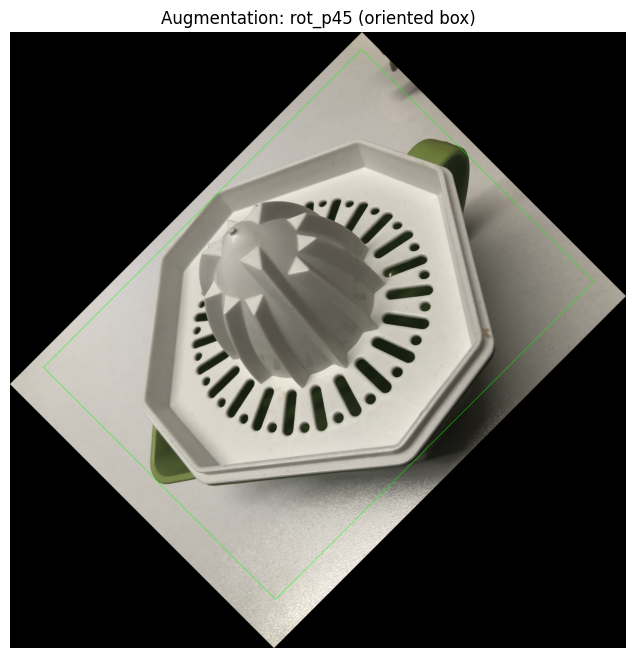

In [18]:
rot_img, polys = rotate_image_with_polygons(image, 45, annotation['boxes'])

img_vis = rot_img.copy()
for poly in polys:
    # draw the 4‐point poly in green
    cv2.polylines(img_vis, [poly], isClosed=True, color=(0,255,0), thickness=2)

plt.figure(figsize=(8,8))
plt.imshow(cv2.cvtColor(img_vis, cv2.COLOR_BGR2RGB))
plt.title("Augmentation: rot_p45 (oriented box)")
plt.axis('off')

Axis-aligned box for polygon: {'class': 'lemon_squeezer', 'xmin': 271, 'ymin': 140, 'xmax': 4726, 'ymax': 4595}


(np.float64(-0.5), np.float64(4988.5), np.float64(4988.5), np.float64(-0.5))

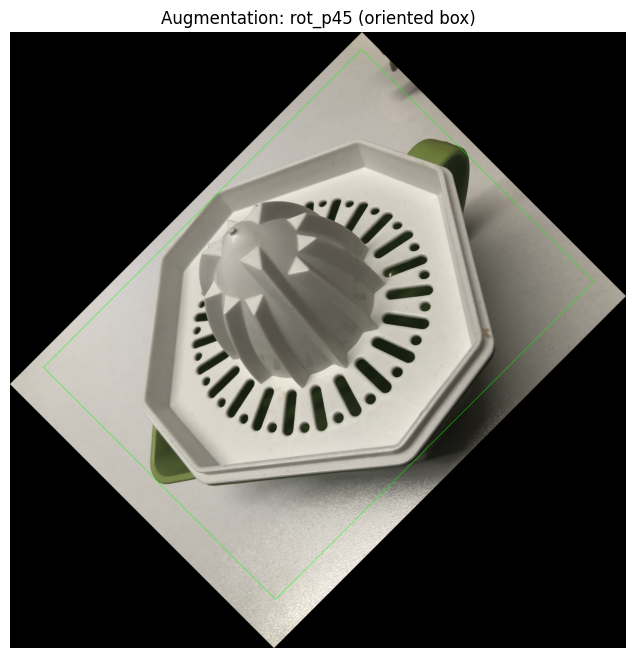

In [19]:
rot_img, polys = rotate_image_with_polygons(image, 45, annotation['boxes'])

img_vis = rot_img.copy()
for poly in polys:
    # draw the 4‐point poly in green
    cv2.polylines(img_vis, [poly], isClosed=True, color=(0,255,0), thickness=2)

    # Define rpts within the loop for later use
    rpts = poly

    # Calculate and print axis-aligned box for each polygon
    x0, y0 = rpts[:,0].min(), rpts[:,1].min()
    x1, y1 = rpts[:,0].max(), rpts[:,1].max()
    axis_aligned_box = {'class': annotation['boxes'][polys.index(poly)]['class'],
                        'xmin': int(x0), 'ymin': int(y0),
                        'xmax': int(x1), 'ymax': int(y1)}
    print(f"Axis-aligned box for polygon: {axis_aligned_box}")

plt.figure(figsize=(8,8))
plt.imshow(cv2.cvtColor(img_vis, cv2.COLOR_BGR2RGB))
plt.title("Augmentation: rot_p45 (oriented box)")
plt.axis('off')

*Bounding boxes are rotated with the image properly, not covering the entire image*

Sharpening and blurring

In [20]:
# 2. Sharpening and blurring
def sharpen_image(image):
    """Sharpen image using a kernel."""
    kernel = np.array([[-1,-1,-1],
                      [-1, 9,-1],
                      [-1,-1,-1]])
    sharpened = cv2.filter2D(image, -1, kernel)
    return sharpened

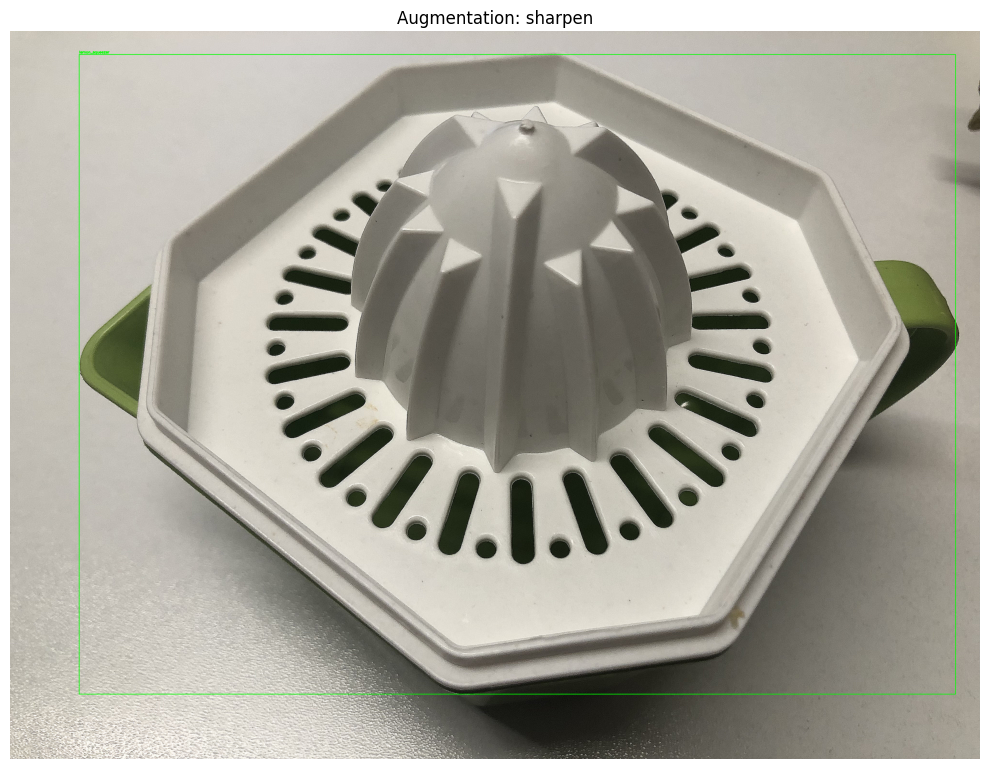

In [21]:
# Sharpen
sh_img = sharpen_image(image)
sh_boxes = annotation['boxes']
visualize_image_with_boxes(sh_img, sh_boxes, "Augmentation: sharpen")

In [22]:
def blur_image(image, kernel_size=5):
    """Blur image using Gaussian blur."""
    blurred = cv2.GaussianBlur(image, (kernel_size, kernel_size), 0)
    return blurred

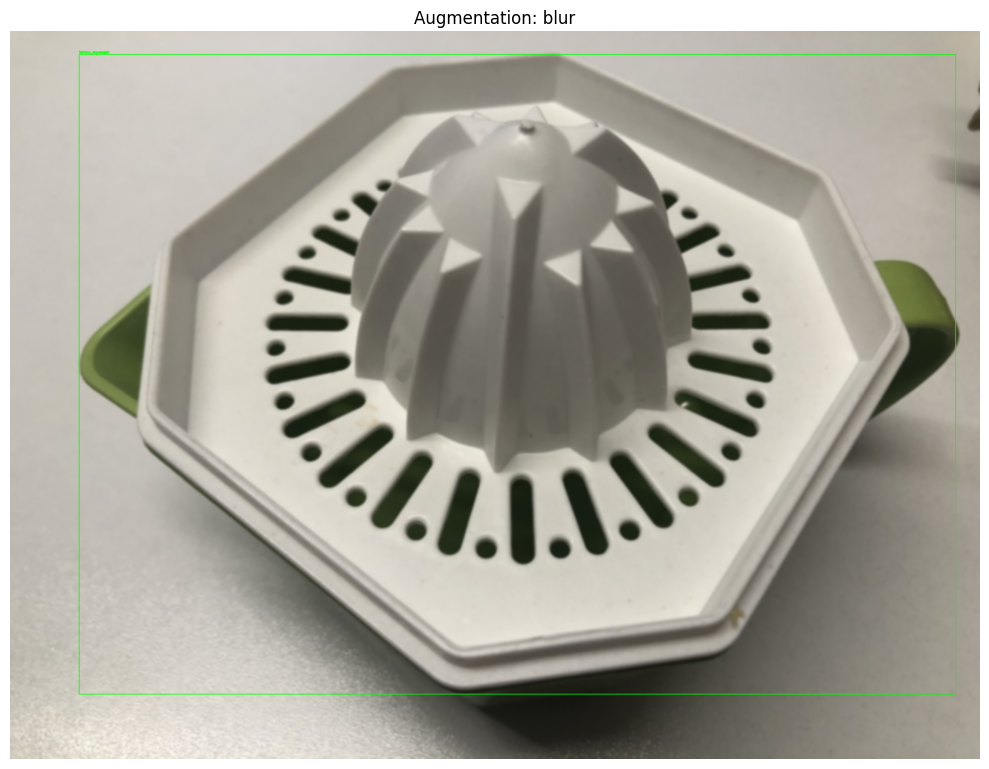

In [23]:
# Blur
b_img = blur_image(image, kernel_size=25)  # try a stronger blur if 5 is too subtle
b_boxes = annotation['boxes']
visualize_image_with_boxes(b_img, b_boxes, "Augmentation: blur")

Brighten and darken

In [24]:
# 3. Brighten and darken
def adjust_brightness(image, factor):
    """Adjust image brightness."""
    # Convert to PIL Image for ImageEnhance
    pil_img = Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    enhancer = ImageEnhance.Brightness(pil_img)
    enhanced_img = enhancer.enhance(factor)
    # Convert back to OpenCV format
    return cv2.cvtColor(np.array(enhanced_img), cv2.COLOR_RGB2BGR)

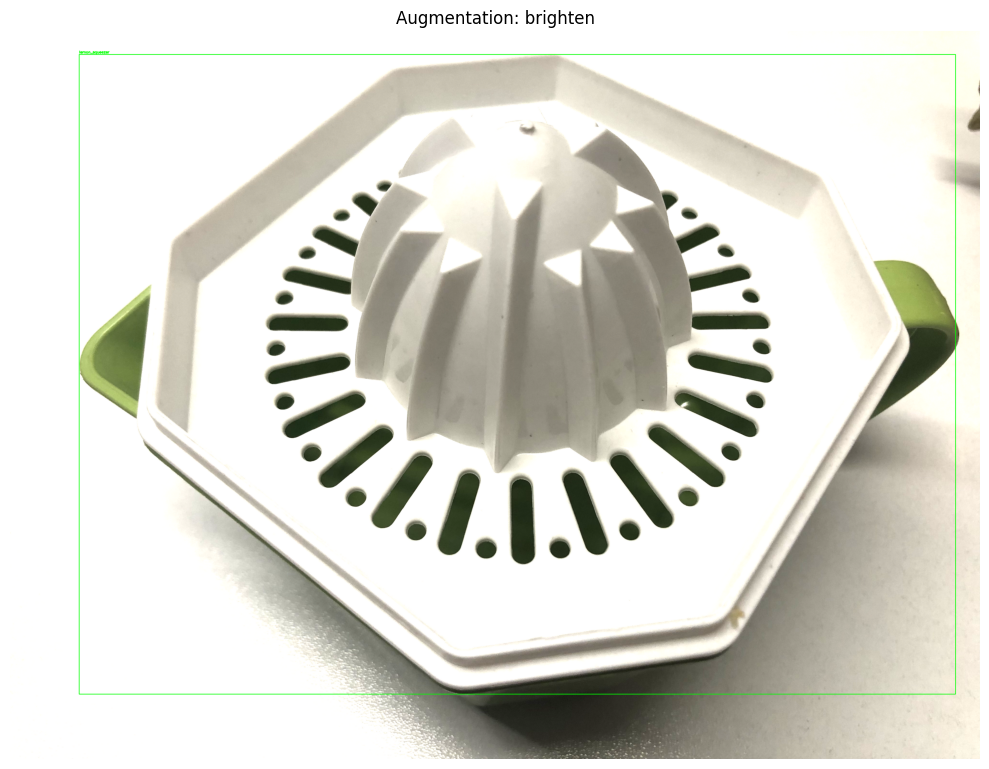

In [25]:
# Brighten
bright_img = adjust_brightness(image, factor=1.5)
bright_boxes = annotation['boxes']
visualize_image_with_boxes(bright_img, bright_boxes, "Augmentation: brighten")

Hue augmentation

In [26]:
# 4. Hue augmentation
def adjust_hue(image, factor):
    """Adjust image hue."""
    # Convert to HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)

    # Shift hue channel
    h = h.astype(int) + int(factor * 180)
    h = np.clip(h, 0, 179).astype(np.uint8)

    # Merge channels and convert back to BGR
    hsv = cv2.merge([h, s, v])
    return cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

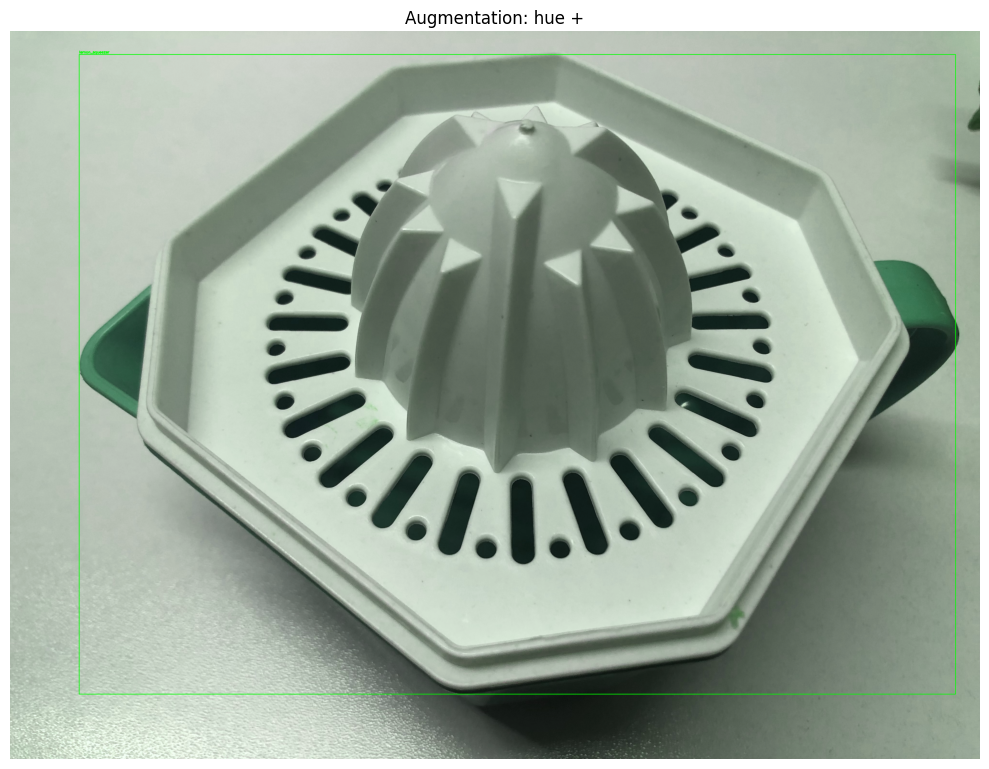

In [27]:
# Hue shift positive
hue_p_img = adjust_hue(image, factor=0.2)
hue_p_boxes = annotation['boxes']
visualize_image_with_boxes(hue_p_img, hue_p_boxes, "Augmentation: hue +")

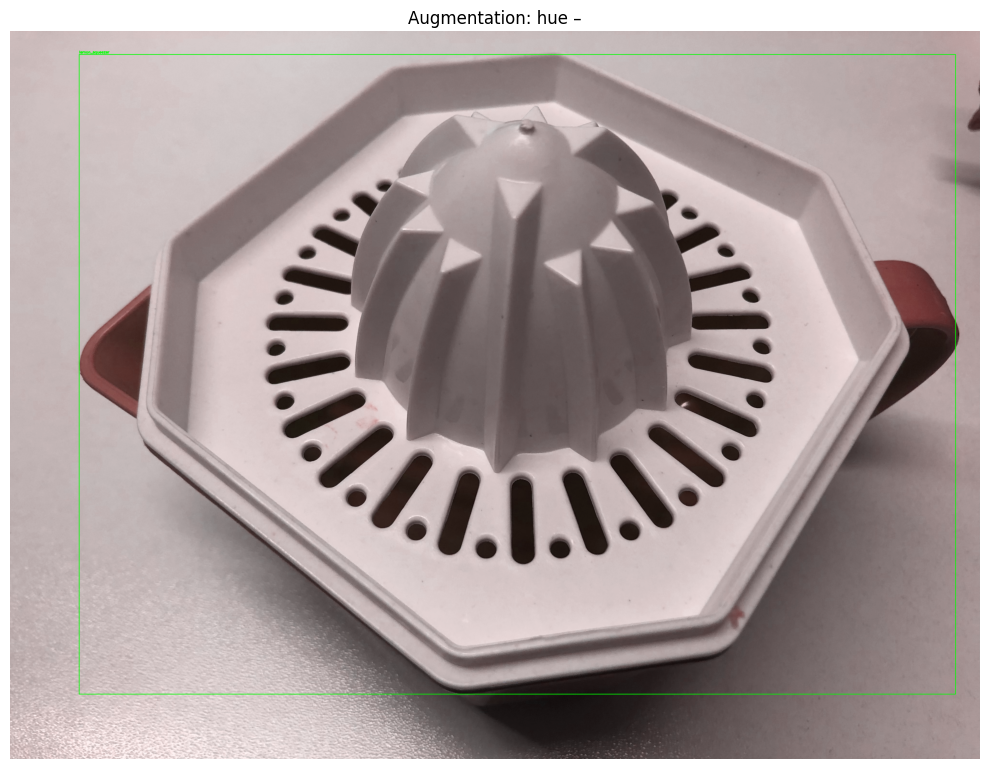

In [28]:
# Hue shift negative
hue_n_img = adjust_hue(image, factor=-0.2)
hue_n_boxes = annotation['boxes']
visualize_image_with_boxes(hue_n_img, hue_n_boxes, "Augmentation: hue –")

Saturation augmentation

In [29]:
# 5. Saturation augmentation
def adjust_saturation(image, factor):
    """Adjust image saturation."""
    # Convert to PIL Image for ImageEnhance
    pil_img = Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    enhancer = ImageEnhance.Color(pil_img)
    enhanced_img = enhancer.enhance(factor)
    # Convert back to OpenCV format
    return cv2.cvtColor(np.array(enhanced_img), cv2.COLOR_RGB2BGR)

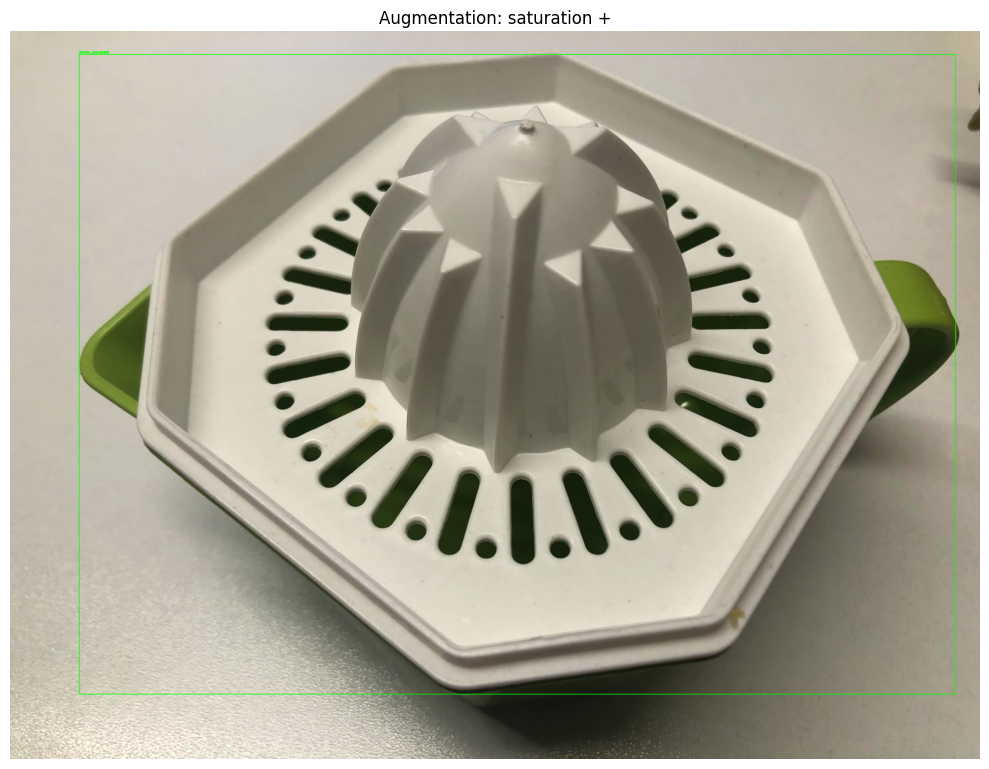

In [30]:
# Saturation increase
sat_inc_img = adjust_saturation(image, factor=1.5)
sat_inc_boxes = annotation['boxes']
visualize_image_with_boxes(sat_inc_img, sat_inc_boxes, "Augmentation: saturation +")

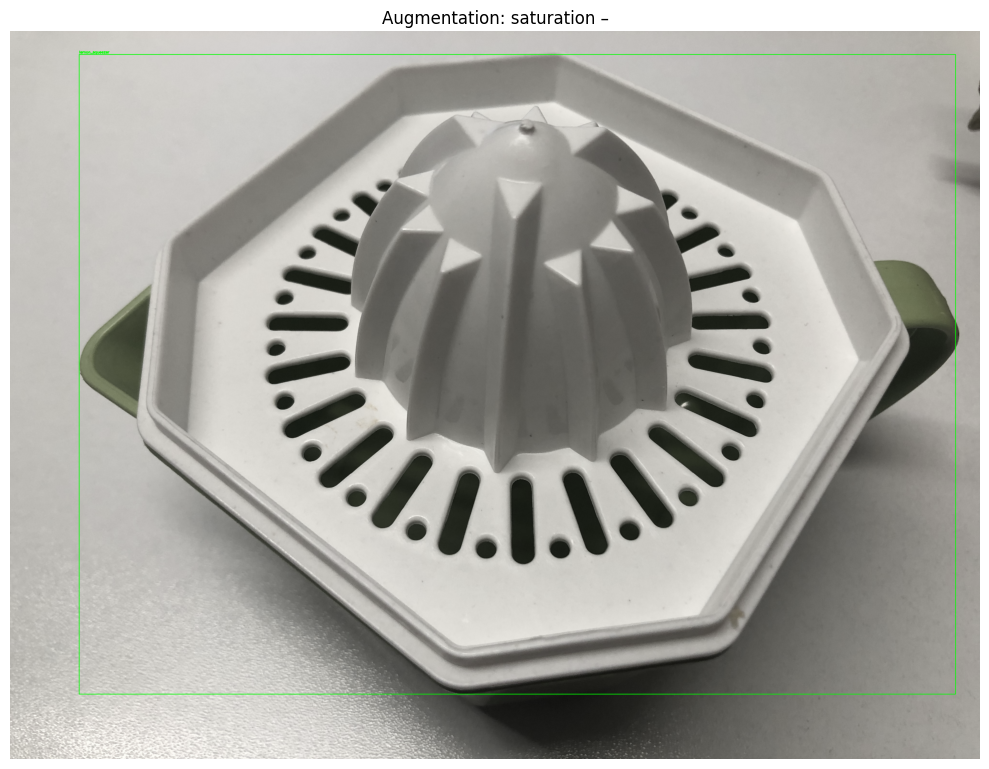

In [31]:
# Saturation decrease
sat_dec_img = adjust_saturation(image, factor=0.5)
sat_dec_boxes = annotation['boxes']
visualize_image_with_boxes(sat_dec_img, sat_dec_boxes, "Augmentation: saturation –")

In [32]:
def augment_and_save(img_path, xml_path, img_out, xml_out, vis_out):
    ann   = parse_annotation(xml_path)
    img   = cv2.imread(img_path)
    base  = os.path.splitext(os.path.basename(img_path))[0]
    w,h   = ann['width'], ann['height']
    boxes = ann['boxes']

    # list of (suffix, img_or_fn, args...)
    jobs = [
      ("h_flip",      flip_horizontal,    (img, boxes, w)),
      ("v_flip",      flip_vertical,      (img, boxes, h)),
      ("rot_p45",     rotate_image,       (img,  45, boxes)),
      ("rot_n45",     rotate_image,       (img, -45, boxes)),
      ("sharp",       lambda i,b,_: (sharpen_image(i), b), (img, boxes, None)),
      ("blur",        lambda i,b,_: (blur_image(i,15), b),  (img, boxes, None)),
      ("bright",      lambda i,b,_: (adjust_brightness(i,1.5), b), (img,boxes,None)),
      ("dark",        lambda i,b,_: (adjust_brightness(i,0.5), b), (img,boxes,None)),
      ("hue_p",       lambda i,b,_: (adjust_hue(i, 0.2),   b), (img,boxes,None)),
      ("hue_n",       lambda i,b,_: (adjust_hue(i,-0.2),   b), (img,boxes,None)),
      ("sat_inc",     lambda i,b,_: (adjust_saturation(i,1.5), b), (img,boxes,None)),
      ("sat_dec",     lambda i,b,_: (adjust_saturation(i,0.5), b), (img,boxes,None)),
    ]

    for suffix, fn, args in jobs:
        # call the augmentation; some return 2-tuples, some 4-tuples
        out = fn(*args)
        if len(out)==4:
            aug_img, aug_boxes, new_w, new_h = out
        else:
            aug_img, aug_boxes = out
            new_w, new_h = w, h

        # 1) raw image
        jpg_path = f"{img_out}/{base}_{suffix}.jpg"
        cv2.imwrite(jpg_path, aug_img)

        # 2) xml
        xml_path_out = f"{xml_out}/{base}_{suffix}.xml"
        update_annotation(xml_path, aug_boxes, new_w, new_h, xml_path_out)

        # 3) visualized jpg
        vis_img = draw_boxes(aug_img, aug_boxes)
        vis_path = f"{vis_out}/{base}_{suffix}_vis.jpg"
        cv2.imwrite(vis_path, vis_img)


In [33]:
img_output_dir, xml_output_dir, vis_output_dir = create_directories()
dataset = load_dataset()
print(f"Augmenting {len(dataset)} samples →\n"
      f"  {img_output_dir}\n"
      f"  {xml_output_dir}\n"
      f"  {vis_output_dir}")
print(f"Found {len(dataset)} samples; will produce {len(dataset)*12} augmented images.")


Loaded 63 image-annotation pairs
Augmenting 63 samples →
  /content/drive/MyDrive/EE 417/THE2/dataset/augmented_images
  /content/drive/MyDrive/EE 417/THE2/dataset/augmented_annotations
  /content/drive/MyDrive/EE 417/THE2/dataset/augmented_images_vis
Found 63 samples; will produce 756 augmented images.


In [34]:
def rotate_image(image, angle, boxes):
    """Rotate image and update bounding boxes."""
    # Original image dimensions
    height, width = image.shape[:2]
    center = (width // 2, height // 2)

    # Calculate rotation matrix
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)

    # Compute new bounding dimensions
    abs_cos = abs(rotation_matrix[0, 0])
    abs_sin = abs(rotation_matrix[0, 1])
    new_width = int(height * abs_sin + width * abs_cos)
    new_height = int(height * abs_cos + width * abs_sin)

    # Adjust translation to center the rotated image
    rotation_matrix[0, 2] += new_width / 2 - center[0]
    rotation_matrix[1, 2] += new_height / 2 - center[1]

    # Perform the actual rotation
    rotated_image = cv2.warpAffine(image, rotation_matrix, (new_width, new_height))

    # Update each bounding box
    rotated_boxes = []
    for box in boxes:
        pts = np.array([
            [box['xmin'], box['ymin'], 1],
            [box['xmax'], box['ymin'], 1],
            [box['xmax'], box['ymax'], 1],
            [box['xmin'], box['ymax'], 1]
        ])
        # Apply rotation to corner points
        rpts = pts.dot(rotation_matrix.T)
        x_min, y_min = rpts[:, 0].min(), rpts[:, 1].min()
        x_max, y_max = rpts[:, 0].max(), rpts[:, 1].max()

        rotated_boxes.append({
            'class': box['class'],
            'xmin': int(x_min), 'ymin': int(y_min),
            'xmax': int(x_max), 'ymax': int(y_max)
        })

    return rotated_image, rotated_boxes, new_width, new_height

In [35]:
# run it
for img_p, xml_p in tqdm(dataset, desc="Augmenting full dataset"):
    augment_and_save(img_p, xml_p,
                     img_output_dir,
                     xml_output_dir,
                     vis_output_dir)

print("✅ Done!  Check your three folders for raw, XML, and visualized versions.")

Augmenting full dataset: 100%|██████████| 63/63 [04:57<00:00,  4.73s/it]

✅ Done!  Check your three folders for raw, XML, and visualized versions.


### Train models (30 points)

In [36]:
!pip install torch torchvision torchmetrics --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 127.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 104.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 43.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 20.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 107.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 961.5/961.5 kB 60.1 MB/s eta 0:00:00


In [37]:
!pip install --upgrade pandas
!pip install --upgrade transformers
!pip install --upgrade torchmetrics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 117.6 MB/s eta 0:00:00
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.2
    Uninstalling pandas-2.2.2:
      Successfully uninstalled pandas-2.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.2.3 which is incompatible.


In [38]:
import os
import random
from glob import glob
import xml.etree.ElementTree as ET

import torch
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision
from torchvision.transforms import functional as F
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.retinanet import RetinaNetClassificationHead
from torchmetrics.detection.mean_ap import MeanAveragePrecision

import cv2
import numpy as np
from PIL import Image
from tqdm import tqdm


In [39]:
import os
import random
from glob import glob
import xml.etree.ElementTree as ET

import torch
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.transforms as T
from torchvision.transforms import functional as F
from torchvision.models.detection import (
    retinanet_resnet50_fpn,
    fasterrcnn_resnet50_fpn,
    RetinaNet_ResNet50_FPN_Weights
)
from torchvision.models.detection.anchor_utils import AnchorGenerator
from torchvision.models.detection.retinanet import RetinaNetClassificationHead
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models import ResNet50_Weights
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from PIL import Image

In [40]:
import os
from glob import glob
import xml.etree.ElementTree as ET
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from torchvision.transforms import functional as F
import torchvision.transforms as T
import random

# ─── 0) POINT AT YOUR FOLDERS ───────────────────────────────────────────────
# Set the base paths according to the folder structure
#BASE_PATH = "/content/drive/MyDrive/EE 417/THE2/dataset"
#IMAGES_PATH = os.path.join(BASE_PATH, "images")
#ANNOTATIONS_PATH = os.path.join(BASE_PATH, "annotations")

DATA_ROOT       = "/content/drive/MyDrive/EE 417/THE2/dataset"
IMG_DIR         = os.path.join(DATA_ROOT, "images")
XML_DIR         = os.path.join(DATA_ROOT, "annotations")
AUG_IMG_DIR     = os.path.join(DATA_ROOT, "augmented_images")
AUG_XML_DIR     = os.path.join(DATA_ROOT, "augmented_annotations")

# ─── 1) GATHER & PAIR IMAGE ↔ XML ────────────────────────────────────────────
orig_imgs = sorted(glob(os.path.join(IMG_DIR,     "*.jpg")))
aug_imgs  = sorted(glob(os.path.join(AUG_IMG_DIR, "*.jpg")))

# build matching xml lists
orig_xmls = [os.path.join(XML_DIR,    os.path.basename(p).replace(".jpg",".xml"))
             for p in orig_imgs]
aug_xmls  = [os.path.join(AUG_XML_DIR, os.path.basename(p).replace(".jpg",".xml"))
             for p in aug_imgs]

# combine
all_imgs = orig_imgs + aug_imgs
all_xmls = orig_xmls + aug_xmls

assert len(all_imgs) == len(all_xmls) and len(all_imgs)>0, \
    f"Found {len(all_imgs)} images but {len(all_xmls)} XMLs."

# ─── 2) BUILD CLASS MAP ─────────────────────────────────────────────────────
classes = sorted({
    obj.find("name").text
    for xml in all_xmls
    for obj in ET.parse(xml).getroot().findall("object")
})
class_map = {c:i+1 for i,c in enumerate(classes)}  # reserve 0 for background


In [41]:
# ensure reproducibility
SEED = 42
torch.manual_seed(SEED)
random.seed(SEED)

In [42]:
# ─── 3) TRAIN/VAL/TEST SPLIT ─────────────────────────────────────────────────
SEED = 42
torch.manual_seed(SEED)
idxs = torch.randperm(len(all_imgs), generator=torch.Generator().manual_seed(SEED)).tolist()

n = len(idxs)
n_train = int(0.6 * n)
n_val   = int(0.2 * n)

train_idxs = idxs[:n_train]
val_idxs   = idxs[n_train:n_train+n_val]
test_idxs  = idxs[n_train+n_val:]

def pick(idxs):
    return [all_imgs[i] for i in idxs], [all_xmls[i] for i in idxs]

train_imgs, train_xmls = pick(train_idxs)
val_imgs,   val_xmls   = pick(val_idxs)
test_imgs,  test_xmls  = pick(test_idxs)

VOC‑style Dataset

In [43]:
class VOCDataset(Dataset):
    def __init__(self, imgs, xmls, class_map, transforms=None):
        self.imgs, self.xmls = imgs, xmls
        self.class_map      = class_map
        self.transforms     = transforms

    def __len__(self): return len(self.imgs)

    def __getitem__(self, idx):
        # load image & annotation
        img = Image.open(self.imgs[idx]).convert("RGB")
        ann = ET.parse(self.xmls[idx]).getroot()

        boxes, labels = [], []
        for obj in ann.findall("object"):
            labels.append(self.class_map[obj.find("name").text])
            bb = obj.find("bndbox")
            boxes.append([
                float(bb.find("xmin").text),
                float(bb.find("ymin").text),
                float(bb.find("xmax").text),
                float(bb.find("ymax").text)
            ])

        boxes  = torch.tensor(boxes, dtype=torch.float32)
        labels = torch.tensor(labels, dtype=torch.int64)

        # PIL‑level transforms only on train
        if self.transforms:
            img = self.transforms(img)

        # finally, to tensor
        return F.to_tensor(img), {
            "boxes":    boxes,
            "labels":   labels,
            "image_id": torch.tensor([idx])
        }

Build dataset & splits

DataLoaders & Collate fn

In [45]:
train_tf = T.Compose([
    T.RandomHorizontalFlip(0.5),
    T.RandomRotation(15),
    T.ColorJitter(brightness=0.2, contrast=0.2,
                  saturation=0.2, hue=0.1),
    # you can add Resize(...) here
])
val_tf = None

In [46]:
def make_loader(imgs, xmls, tf, shuffle):
    ds = VOCDataset(imgs, xmls, class_map, transforms=tf)
    return DataLoader(
        ds,
        batch_size=4 if shuffle else 2,
        shuffle=shuffle,
        collate_fn=lambda b: tuple(zip(*b))
    )

train_loader = make_loader(train_imgs, train_xmls, train_tf, shuffle=True)
val_loader   = make_loader(val_imgs,   val_xmls,   val_tf,   shuffle=False)
test_loader  = make_loader(test_imgs,  test_xmls,  val_tf,   shuffle=False)


In [47]:
print(f"→ train/val/test: {len(train_loader.dataset)}/"
      f"{len(val_loader.dataset)}/"
      f"{len(test_loader.dataset)} samples")

→ train/val/test: 491/163/165 samples


Model Factory

In [48]:
import os
import cv2
import torch
import torchvision
import numpy as np
from PIL import Image
from tqdm import tqdm
from torchvision.transforms import functional as F
from torchvision.models.detection import (
    retinanet_resnet50_fpn, RetinaNet_ResNet50_FPN_Weights,
    fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights
)
from torchvision.models.detection.anchor_utils import AnchorGenerator
from torchvision.models.detection.retinanet import RetinaNetClassificationHead
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torch.utils.data import DataLoader


In [93]:
from PIL import Image

In [49]:
def get_retinanet_builder(num_classes, backbone_pretrained: bool):
    # small‐anchor generator
    anchor_gen = AnchorGenerator(
        sizes=((16,32),(32,64),(64,128),(128,256),(256,512)),
        aspect_ratios=((0.5,1.0,2.0),)*5
    )
    # load model without COCO head but with optional ImageNet backbone
    model = retinanet_resnet50_fpn(
        weights=None,
        weights_backbone=(ResNet50_Weights.IMAGENET1K_V1
                          if backbone_pretrained else None),
        anchor_generator=anchor_gen,
        score_thresh=0.0
    )
    # swap in fresh head for our num_classes
    in_ch   = model.head.classification_head.cls_logits.in_channels
    n_anc   = model.head.classification_head.num_anchors
    model.head.classification_head = RetinaNetClassificationHead(
        in_channels=in_ch,
        num_anchors=n_anc,
        num_classes=num_classes,
        prior_probability=0.01
    )
    return model

In [50]:
def get_frcnn_builder(num_classes, backbone_pretrained: bool):
    anchor_gen = AnchorGenerator(
        sizes=((16,32,64),(32,64,128),(64,128,256),(128,256,512)),
        aspect_ratios=((0.5,1.0,2.0),)*4
    )
    model = fasterrcnn_resnet50_fpn(
        weights=None,
        weights_backbone=(ResNet50_Weights.IMAGENET1K_V1
                          if backbone_pretrained else None),
        rpn_anchor_generator=anchor_gen,
        box_score_thresh=0.0
    )
    in_feat = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_feat, num_classes)
    return model



Training & Evaluation Loops

In [51]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [52]:
from tqdm.auto import tqdm, trange

def train_one_epoch(model, loader, optimizer, device, epoch=None):
    model.train()
    total_loss = 0.0

    pbar = tqdm(
        loader,
        desc=f"Epoch {epoch:02d} Train",
        leave=False
    )
    for imgs, tgts in pbar:
        imgs = [im.to(device) for im in imgs]
        tgts = [{k:v.to(device) for k,v in t.items()} for t in tgts]

        loss_dict = model(imgs, tgts)
        loss = sum(loss_dict.values())

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        pbar.set_postfix(loss=total_loss / (pbar.n + 1))

    return total_loss / len(loader)

In [53]:
@torch.no_grad()
def evaluate_map(model, loader, device):
    metric = MeanAveragePrecision()
    model.eval()
    for imgs, targets in loader:
        imgs = [img.to(device) for img in imgs]
        tgts = [{k:v.to(device) for k,v in t.items()} for t in targets]
        preds = model(imgs)
        preds = [{k:v.cpu() for k,v in p.items()} for p in preds]
        tgts  = [{k:v.cpu() for k,v in t.items()} for t in tgts]
        metric.update(preds, tgts)
    return metric.compute()

In [54]:
@torch.no_grad()
def evaluate_prf(model, loader, iou_thresh=0.5):
    tp=fp=fn=0
    model.eval()
    for imgs, tgts in loader:
        imgs = [im.to(device) for im in imgs]
        preds = model(imgs)
        for p,t in zip(preds, tgts):
            bp = p["boxes"].cpu()
            bt = t["boxes"]
            matched = set()
            for box in bp:
                ious = torchvision.ops.box_iou(box.unsqueeze(0), bt).squeeze(0)
                best, idx = ious.max(0)
                if best>=iou_thresh and idx.item() not in matched:
                    tp+=1; matched.add(idx.item())
                else:
                    fp+=1
            fn += (len(bt)-len(matched))
    prec = tp/(tp+fp) if tp+fp>0 else 0.0
    rec  = tp/(tp+fn) if tp+fn>0 else 0.0
    f1   = 2*prec*rec/(prec+rec) if prec+rec>0 else 0.0
    return prec, rec, f1

In [55]:
def run_experiment(name, builder, backbone_pre, epochs=20):
    print(f"\n\n─── {name} ─────────────────────────────────────────────────\n")
    model = builder(len(class_map)+1, backbone_pre).to(device)

    # freeze backbone 2 epochs
    for p in model.backbone.parameters():
        p.requires_grad = False

    optimizer = torch.optim.SGD(
        [p for p in model.parameters() if p.requires_grad],
        lr=1e-3, momentum=0.9, weight_decay=1e-4
    )
    scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
        optimizer, T_0=len(train_loader), T_mult=2
    )
    best_f1 = 0.0

    for ep in range(1, epochs+1):
        # Pass the 'device' argument to train_one_epoch
        loss = train_one_epoch(model, train_loader, optimizer, device, epoch=ep)
        if ep==3:
            for p in model.backbone.parameters():
                p.requires_grad = True
        optimizer.step(); scheduler.step()

        prec, rec, f1 = evaluate_prf(model, val_loader)
        print(f"Epoch {ep:02d}  loss={loss:.3f}  P={prec:.3f}  R={rec:.3f}  F1={f1:.3f}")

        if f1>best_f1:
            best_f1 = f1
            torch.save(model.state_dict(), f"{name}_best.pth")

    print(f"\n→ Final test mAP: {evaluate_map(model, test_loader, device)}") # Pass device to evaluate_map

Confusion Matrix

In [66]:
import os
import cv2
import torch
import torchvision
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# class_map and a reverse lookup
# e.g. {1:"lemon_squeezer", 2:"slipper"}
inv_class_map = {v:k for k,v in class_map.items()}
class_names   = {0:"background", **inv_class_map}

In [67]:
def visualize_predictions(
    model,
    checkpoint_path: str,
    device: torch.device,
    dataset,             # e.g. test_ds
    output_dir: str,
    score_thresh: float = 0.5
):
    os.makedirs(output_dir, exist_ok=True)
    model.load_state_dict(torch.load(checkpoint_path, map_location=device))
    model.to(device).eval()

    for idx in range(len(dataset)):
        img_tensor, target = dataset[idx]
        # convert to H×W×C uint8 for cv2
        img = (img_tensor * 255).permute(1,2,0).byte().cpu().numpy()
        img_draw = img.copy()

        with torch.no_grad():
            pred = model([img_tensor.to(device)])[0]

        for box, lbl, score in zip(pred["boxes"], pred["labels"], pred["scores"]):
            if score < score_thresh:
                continue
            x1,y1,x2,y2 = map(int, box.cpu().tolist())
            name = class_names[int(lbl.cpu())]
            color = (0,255,0)
            cv2.rectangle(img_draw, (x1,y1), (x2,y2), color, 2)
            text = f"{name} {score:.2f}"
            cv2.putText(img_draw, text, (x1, y1-6),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

        out_path = os.path.join(output_dir, f"pred_{idx}.jpg")
        cv2.imwrite(out_path, img_draw)

    print(f"Saved visualizations to {output_dir}/")

In [79]:
def compute_detection_confusion(
    model, ckpt_path, device, dataset,
    iou_thresh=0.5, score_thresh=0.0   # << default to 0
):
    model.load_state_dict(torch.load(ckpt_path, map_location=device))
    model.to(device).eval()

    y_true, y_pred = [], []
    for img_tensor, target in dataset:
        gt_boxes, gt_labels = target["boxes"], target["labels"]

        with torch.no_grad():
            pred = model([img_tensor.to(device)])[0]

        # **no** score filtering: include all preds
        boxes_p, labels_p = pred["boxes"].cpu(), pred["labels"].cpu()

        matched = set()
        for pb, pl in zip(boxes_p, labels_p):
            ious = torchvision.ops.box_iou(pb.unsqueeze(0), gt_boxes).squeeze(0)
            best_iou, best_idx = ious.max(0)
            if best_iou >= iou_thresh and best_idx.item() not in matched:
                y_true.append(int(gt_labels[best_idx]))
                y_pred.append(int(pl))
                matched.add(best_idx.item())
            else:
                y_true.append(0)
                y_pred.append(int(pl))

        # account for missed GTs
        for i, gl in enumerate(gt_labels):
            if i not in matched:
                y_true.append(int(gl))
                y_pred.append(0)

    labels = list(class_names.keys())
    cm = confusion_matrix(y_true, y_pred, labels=labels)
    return cm, labels


In [69]:
def plot_confusion_matrix(cm, labels):
    fig, ax = plt.subplots(figsize=(6,6))
    im = ax.imshow(cm, interpolation="nearest", cmap="Blues")
    ax.figure.colorbar(im, ax=ax)
    ax.set_xticks(labels, [class_names[l] for l in labels], rotation=45, ha="right")
    ax.set_yticks(labels, [class_names[l] for l in labels])
    ax.set_xlabel("Predicted")
    ax.set_ylabel("Actual")
    for i in labels:
        for j in labels:
            ax.text(j, i, cm[i, j], ha="center", va="center",
                    color="white" if cm[i,j] > cm.max()/2 else "black")
    plt.tight_layout()
    plt.show()


#### From Scratch: One Stage Detector

In [57]:
# 1) Scratch, one‐stage
run_experiment("Scratch_RetinaNet",
               builder=get_retinanet_builder,
               backbone_pre=False,
               epochs=5)



─── Scratch_RetinaNet ─────────────────────────────────────────────────



Epoch 01 Train:   0%|          | 0/123 [00:00<?, ?it/s]

Epoch 01  loss=1.823  P=0.001  R=0.424  F1=0.003


Epoch 02 Train:   0%|          | 0/123 [00:00<?, ?it/s]

Epoch 02  loss=1.636  P=0.002  R=0.630  F1=0.004


Epoch 03 Train:   0%|          | 0/123 [00:00<?, ?it/s]

Epoch 03  loss=1.579  P=0.002  R=0.503  F1=0.003


Epoch 04 Train:   0%|          | 0/123 [00:00<?, ?it/s]

Epoch 04  loss=1.537  P=0.002  R=0.618  F1=0.004


Epoch 05 Train:   0%|          | 0/123 [00:00<?, ?it/s]

Epoch 05  loss=1.452  P=0.002  R=0.648  F1=0.004


/usr/local/lib/python3.11/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)



→ Final test mAP: {'map': tensor(0.0034), 'map_50': tensor(0.0154), 'map_75': tensor(0.0002), 'map_small': tensor(-1.), 'map_medium': tensor(-1.), 'map_large': tensor(0.0034), 'mar_1': tensor(0.0234), 'mar_10': tensor(0.1150), 'mar_100': tensor(0.1808), 'mar_small': tensor(-1.), 'mar_medium': tensor(-1.), 'mar_large': tensor(0.1808), 'map_per_class': tensor(-1.), 'mar_100_per_class': tensor(-1.), 'classes': tensor([1, 2], dtype=torch.int32)}


*The above cell ran for 12 minutes per epoch*

In [76]:
from torch.amp import GradScaler, autocast
from tqdm.auto import tqdm, trange

def train_one_epoch_faster(model, loader, optimizer, device, scaler, epoch=None):
    model.train()
    total_loss = 0.0

    pbar = tqdm(
        loader,
        desc=f"Epoch {epoch:02d} Train",
        leave=False
    )
    for imgs, tgts in pbar:
        imgs = [im.to(device) for im in imgs]
        tgts = [{k:v.to(device) for k,v in t.items()} for t in tgts]

        optimizer.zero_grad()

        # mixed‑precision forward
        with autocast(device_type="cuda"):
            loss_dict = model(imgs, tgts)
            loss = sum(loss_dict.values())

        # scale + backward + step
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        total_loss += loss.item()
        pbar.set_postfix(loss=total_loss / (pbar.n + 1))

    return total_loss / len(loader)

@torch.no_grad()
def evaluate_prf_fast(model, loader, iou_thresh=0.5): # Remove device parameter
    tp=fp=fn=0
    model.eval()
    for imgs, tgts in loader:
        imgs = [im.to(device) for im in imgs]
        preds = model(imgs)
        for p,t in zip(preds, tgts):
            bp = p["boxes"].cpu()
            bt = t["boxes"]
            matched = set()
            for box in bp:
                ious = torchvision.ops.box_iou(box.unsqueeze(0), bt).squeeze(0)
                best, idx = ious.max(0)
                if best>=iou_thresh and idx.item() not in matched: # iou_thresh will now use its default value
                    tp+=1; matched.add(idx.item())
                else:
                    fp+=1
            fn += (len(bt)-len(matched))
    prec = tp/(tp+fp) if tp+fp>0 else 0.0
    rec  = tp/(tp+fn) if tp+fn>0 else 0.0
    f1   = 2*prec*rec/(prec+rec) if prec+rec>0 else 0.0
    return prec, rec, f1

def run_experiment_faster(name, builder, backbone_pre, epochs=20):
    print(f"\n\n─── {name} ─────────────────────────────────────────────────\n")
    model = builder(len(class_map)+1, backbone_pre).to(device)

    # freeze backbone for first two epochs
    for p in model.backbone.parameters():
        p.requires_grad = False

    optimizer = torch.optim.SGD(
        [p for p in model.parameters() if p.requires_grad],
        lr=1e-3, momentum=0.9, weight_decay=1e-4
    )
    scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
        optimizer, T_0=len(train_loader), T_mult=2
    )

    scaler = GradScaler()
    best_f1 = 0.0

    # outer epoch loop with tqdm
    for ep in trange(1, epochs+1, desc=name, unit="ep"):
        loss = train_one_epoch_faster(
            model,
            train_loader,
            optimizer,
            device,
            scaler,
            epoch=ep
        )

        # unfreeze backbone starting epoch 3
        if ep == 3:
            for p in model.backbone.parameters():
                p.requires_grad = True

        scheduler.step()

        prec, rec, f1 = evaluate_prf_fast(model, val_loader)
        print(f"Epoch {ep:02d}  loss={loss:.3f}  "
              f"P={prec:.3f}  R={rec:.3f}  F1={f1:.3f}")

        if f1 > best_f1:
            best_f1 = f1
            torch.save(model.state_dict(), f"{name}_best.pth")

    print(f"\n→ Final test mAP: {evaluate_map(model, test_loader, device)}")


#### Fine tune: One Stage Detector

In [77]:
# 2) Fine‐tune, one‐stage
run_experiment_faster("Finetune_RetinaNet",
               builder=get_retinanet_builder,
               backbone_pre=True,
               epochs=5)



─── Finetune_RetinaNet ─────────────────────────────────────────────────



Finetune_RetinaNet:   0%|          | 0/5 [00:00<?, ?ep/s]

Epoch 01 Train:   0%|          | 0/123 [00:00<?, ?it/s]

Epoch 01  loss=1.860  P=0.001  R=0.321  F1=0.002


Epoch 02 Train:   0%|          | 0/123 [00:00<?, ?it/s]

Epoch 02  loss=1.767  P=0.002  R=0.570  F1=0.004


Epoch 03 Train:   0%|          | 0/123 [00:00<?, ?it/s]

Epoch 03  loss=1.481  P=0.003  R=0.745  F1=0.005


Epoch 04 Train:   0%|          | 0/123 [00:00<?, ?it/s]

Epoch 04  loss=1.378  P=0.003  R=0.812  F1=0.005


Epoch 05 Train:   0%|          | 0/123 [00:00<?, ?it/s]

Epoch 05  loss=1.309  P=0.003  R=0.891  F1=0.006


/usr/local/lib/python3.11/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)



→ Final test mAP: {'map': tensor(0.0360), 'map_50': tensor(0.0857), 'map_75': tensor(0.0259), 'map_small': tensor(-1.), 'map_medium': tensor(-1.), 'map_large': tensor(0.0360), 'mar_1': tensor(0.1435), 'mar_10': tensor(0.2785), 'mar_100': tensor(0.3305), 'mar_small': tensor(-1.), 'mar_medium': tensor(-1.), 'mar_large': tensor(0.3305), 'map_per_class': tensor(-1.), 'mar_100_per_class': tensor(-1.), 'classes': tensor([1, 2], dtype=torch.int32)}


*The above cell ran for 12 minutes per epoch, time optimizations failed*

!!! Due to time limitation I had, I couldn't run these two cells for two stage detector with fasterRCNN model

#### From Scratch: Two Stage Detector

In [95]:
'''# 3) Scratch, two‐stage
run_experiment("Scratch_FasterRCNN",
               builder=get_frcnn_builder,
               backbone_pre=False,
               epochs=5)'''

'# 3) Scratch, two‐stage\nrun_experiment("Scratch_FasterRCNN",\n               builder=get_frcnn_builder,\n               backbone_pre=False,\n               epochs=5)'

#### Fine tune: Two Stage Detector

In [96]:
'''# 4) Fine‐tune, two‐stage
run_experiment("Finetune_FasterRCNN",
               builder=get_frcnn_builder,
               backbone_pre=True,
               epochs=5)'''

'# 4) Fine‐tune, two‐stage\nrun_experiment("Finetune_FasterRCNN",\n               builder=get_frcnn_builder,\n               backbone_pre=True,\n               epochs=5)'

Displaying Confusion Matrices for Builded Models


Scratch_RetinaNet on VAL set


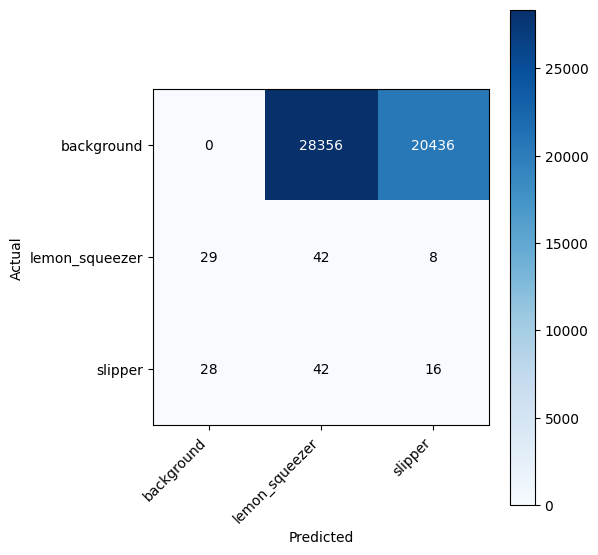


Finetune_RetinaNet on VAL set


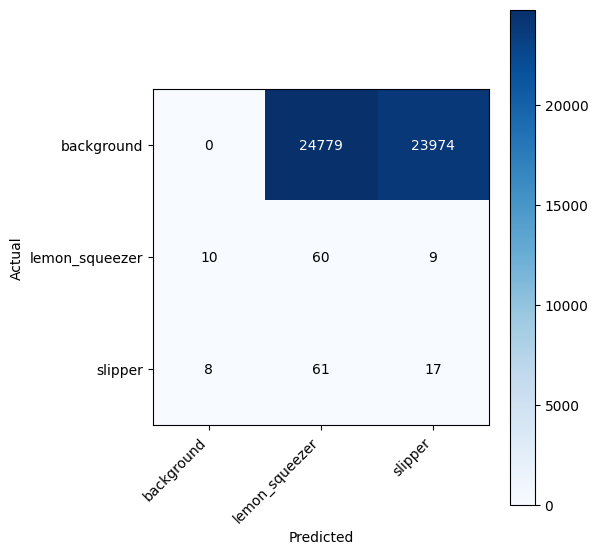

In [80]:
runs = [
    # name,               builder,               pretrained_backbone,  checkpoint
    ("Scratch_RetinaNet", get_retinanet_builder, False,               "Scratch_RetinaNet_best.pth"),
    ("Finetune_RetinaNet",get_retinanet_builder, True,                "Finetune_RetinaNet_best.pth"),
    #("Scratch_FasterRCNN",get_frcnn_builder,    False,               "Scratch_FasterRCNN_best.pth"),
    #("Finetune_FasterRCNN",get_frcnn_builder,    True,                "Finetune_FasterRCNN_best.pth"),
]

for name, builder, pre, ckpt in runs:
    print(f"\n{name} on VAL set")
    # 1) Instantiate the model architecture
    model = builder(len(class_map)+1, pre).to(device)
    # 2) Compute the confusion on val_ds
    cm, labels = compute_detection_confusion(
        model,
        ckpt,
        device,
        val_loader.dataset,        # ←  validation DATASET
        iou_thresh=0.5,
        score_thresh=0.5
    )
    # 3) Plot it
    plot_confusion_matrix(cm, labels)


### Infer the models (10 points)

In [81]:
import os
import cv2
import torch
from torchvision.transforms import functional as F

In [82]:
# reverse map for printing
inv_class_map = {v:k for k,v in class_map.items()}
class_names   = {0:"background", **inv_class_map}

In [83]:
def infer_and_save(
    model,
    ckpt_path: str,
    dataset,                # your test_ds
    device: torch.device,
    output_dir: str,
    score_thresh: float = 0.5
):
    os.makedirs(output_dir, exist_ok=True)
    # 1) load weights & set eval
    model.load_state_dict(torch.load(ckpt_path, map_location=device))
    model.to(device).eval()

    # 2) loop over all test images
    for idx in range(len(dataset)):
        img_tensor, _ = dataset[idx]
        # keep a CPU copy for drawing
        img_np = (img_tensor * 255).permute(1,2,0).byte().cpu().numpy()
        vis   = img_np.copy()

        # 3) run model
        with torch.no_grad():
            pred = model([img_tensor.to(device)])[0]

        # 4) overlay all high‑confidence detections
        for box, lbl, score in zip(pred["boxes"], pred["labels"], pred["scores"]):
            if score < score_thresh:
                continue
            x1,y1,x2,y2 = map(int, box.cpu().tolist())
            name        = class_names[int(lbl.cpu())]
            color       = (0,255,0)
            cv2.rectangle(vis, (x1,y1), (x2,y2), color, 2)
            cv2.putText(vis, f"{name} {score:.2f}", (x1,y1-6),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

        # 5) save to disk
        fn = f"{output_dir}/{os.path.basename(dataset.imgs[idx])}"
        cv2.imwrite(fn, vis)

    print(f"→ Saved inference visuals for {ckpt_path} into {output_dir}/")


In [84]:
runs = [
    ("Scratch_RetinaNet",   get_retinanet_builder, False,  "Scratch_RetinaNet_best.pth"),
    ("Finetune_RetinaNet",  get_retinanet_builder, True,   "Finetune_RetinaNet_best.pth"),
    #("Scratch_FasterRCNN",  get_frcnn_builder,    False,  "Scratch_FasterRCNN_best.pth"),
    #("Finetune_FasterRCNN", get_frcnn_builder,    True,   "Finetune_FasterRCNN_best.pth"),
]

for name, builder, pre, ckpt in runs:
    # rebuild the model
    model = builder(len(class_map)+1, pre)
    # infer on the test split & save overlays
    infer_and_save(
        model,
        ckpt_path=os.path.join(".", ckpt),
        dataset=test_loader.dataset,
        device=device,
        output_dir=f"inference_{name}"
    )

→ Saved inference visuals for ./Scratch_RetinaNet_best.pth into inference_Scratch_RetinaNet/
→ Saved inference visuals for ./Finetune_RetinaNet_best.pth into inference_Finetune_RetinaNet/


In [88]:
from PIL import Image

In [90]:
runs = [
    ("Scratch_RetinaNet",   get_retinanet_builder, False,  "Scratch_RetinaNet_best.pth"),
    ("Finetune_RetinaNet",  get_retinanet_builder, True,   "Finetune_RetinaNet_best.pth"),
    #("Scratch_FasterRCNN",  get_frcnn_builder,    False,  "Scratch_FasterRCNN_best.pth"),
    #("Finetune_FasterRCNN", get_frcnn_builder,    True,   "Finetune_FasterRCNN_best.pth"),
]

for name, builder, pre, ckpt in runs:
    # rebuild the model
    model = builder(len(class_map)+1, pre)
    # infer on the test split & save overlays
    infer_and_save(
        model,
        ckpt_path="Finetune_RetinaNet_best.pth",
        dataset=test_loader.dataset,
        device=device,
        output_dir=os.path.join( "/content/drive/MyDrive/EE 417/THE2/dataset", "inference_{}".format(name)),
        score_thresh=0.1                                   # see next section
    )

→ Saved inference visuals for Finetune_RetinaNet_best.pth into /content/drive/MyDrive/EE 417/THE2/dataset/inference_Scratch_RetinaNet/
→ Saved inference visuals for Finetune_RetinaNet_best.pth into /content/drive/MyDrive/EE 417/THE2/dataset/inference_Finetune_RetinaNet/


Showing: IMG_5595_dark.jpg


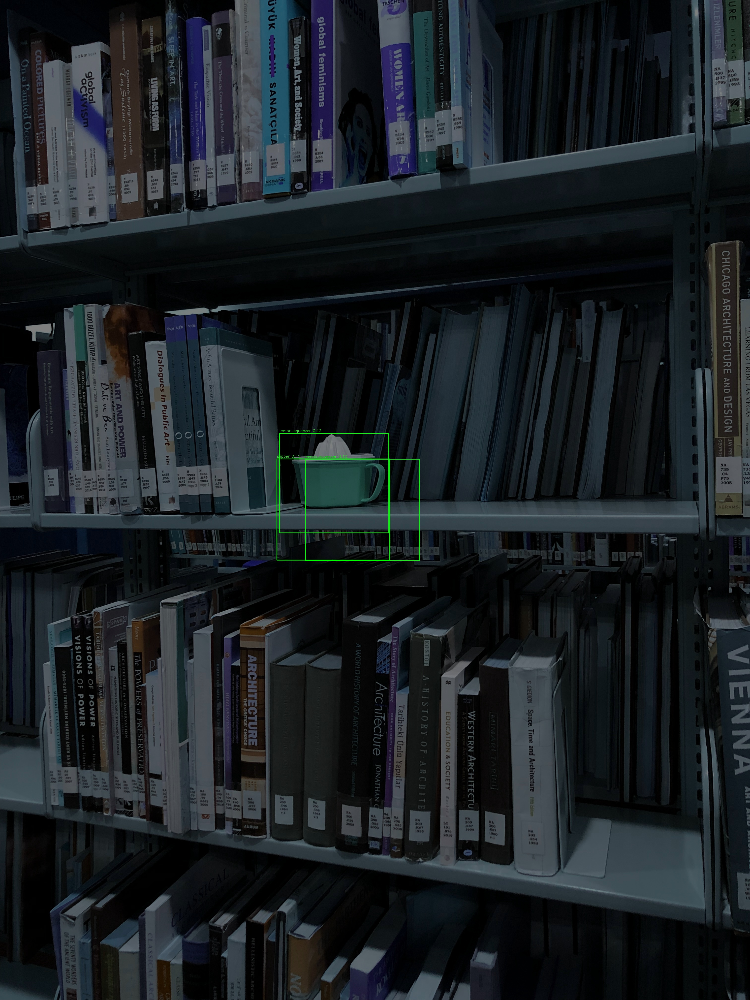

In [91]:
import os
import random
from IPython.display import Image, display

output_dir = "/content/drive/MyDrive/EE 417/THE2/dataset/inference_Finetune_RetinaNet"
files = os.listdir(output_dir)
sample = random.choice([f for f in files if f.endswith(".jpg")])

print("Showing:", sample)
display(Image(filename=os.path.join(output_dir, sample)))
